# July 26 - Fixing VAE

## The VAE loss function had a bug with the MSE loss being scaled due to the `reduction = mean`

In [1]:
# Imports
import math
import os
import sys
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from mpl_toolkits.mplot3d import Axes3D

# Add the path to the parent directory to augment search for module
par_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
if par_dir not in sys.path:
    sys.path.append(par_dir)
    
# Import the custom plotting module
from plot_utils import plot_utils
import random
import torch
from plot_utils import notebook_utils_2

In [2]:
def plot_training_diagnostics(run_id):
    
    notebook_utils_2.plot_log(run_id, "ENet(VAE)", None, "VAE", "training")
    notebook_utils_2.plot_log(run_id, "ENet(VAE)", None, "VAE", "training_validation")
    
    notebook_utils_2.plot_event(run_id, 56, "training")
    notebook_utils_2.plot_event(run_id, 28000, "training")
    notebook_utils_2.plot_event(run_id, 56000, "training")
    
    notebook_utils_2.plot_samples(run_id, 32, "ENet_0")
    notebook_utils_2.plot_samples(run_id, 64, "ENet_56250")
    
def plot_latent_diagnostics(run_id):
    
    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

    # Load the numpy array for the various iterations
    np_arr_0 = np.load(dump_dir + "iteration_" + str(56) + ".npz")
    np_arr_1 = np.load(dump_dir + "iteration_" + str(28000) + ".npz")
    np_arr_2 = np.load(dump_dir + "iteration_" + str(56000) + ".npz")

    # Extract the latent vector np arrays from the loaded archive
    np_arr_0_z, np_arr_1_z, np_arr_2_z = np_arr_0["z"], np_arr_1["z"], np_arr_2["z"]
    
    #--------------------------------------------------------------------------
    # Plot 1
    #--------------------------------------------------------------------------

    np_arr_0_z_0 = np_arr_0_z[:,0]
    np_arr_1_z_0 = np_arr_1_z[:,0]
    np_arr_2_z_0 = np_arr_2_z[:,0]

    num_bins = 100

    # Initialize the plot and corresponding parameters
    fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
    ax.tick_params(axis="both", labelsize=20)

    # Setup the bins beforehand
    bins = np.linspace(min(np.amin(np_arr_0_z_0), np.amin(np_arr_1_z_0), np.amin(np_arr_2_z_0)),
                       max(np.amax(np_arr_0_z_0), np.amax(np_arr_1_z_0), np.amax(np_arr_2_z_0)),
                       num_bins)

    plt.hist(np_arr_0_z_0, bins, density=False,
             label="iteration 56", color="red", stacked=True, histtype="step")

    plt.hist(np_arr_1_z_0, bins, density=False,
             label="iteration 28000", color="blue", stacked=True, histtype="step")

    plt.hist(np_arr_2_z_0, bins, density=False,
             label="iteration 56000", color="green", stacked=True, histtype="step")

    # Setup the axes
    ax.set_xlabel(r"$z_0$", fontsize=20)
    ax.set_ylabel("Frequency", fontsize=20)

    plt.legend(loc="upper right", prop={"size":20})
    plt.grid(True)
    plt.title(r"Distribution of $z_0$ at intervals 56, 28000, 56000", fontsize=20)
    
    #--------------------------------------------------------------------------
    # Plot 2
    #--------------------------------------------------------------------------
    
    np_arr_0_z_0 = np_arr_0_z.reshape(-1, 1)
    np_arr_1_z_0 = np_arr_1_z.reshape(-1, 1)
    np_arr_2_z_0 = np_arr_2_z.reshape(-1, 1)

    num_bins = 100

    # Initialize the plot and corresponding parameters
    fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
    ax.tick_params(axis="both", labelsize=20)

    # Setup the bins beforehand
    bins = np.linspace(min(np.amin(np_arr_0_z_0), np.amin(np_arr_1_z_0), np.amin(np_arr_2_z_0)),
                       max(np.amax(np_arr_0_z_0), np.amax(np_arr_1_z_0), np.amax(np_arr_2_z_0)),
                       num_bins)

    plt.hist(np_arr_0_z_0, bins, density=False,
             label="iteration 56", color="red", stacked=True, histtype="step")

    plt.hist(np_arr_1_z_0, bins, density=False,
             label="iteration 28000", color="blue", stacked=True, histtype="step")

    plt.hist(np_arr_2_z_0, bins, density=False,
             label="iteration 56000", color="green", stacked=True, histtype="step")

    # Setup the axes
    ax.set_xlabel(r"$z$", fontsize=20)
    ax.set_ylabel("Frequency", fontsize=20)

    plt.legend(loc="upper right", prop={"size":20})
    plt.yscale("log")
    plt.grid(True)
    plt.title(r"Distribution of $z$ at intervals 56, 28000, 56000", fontsize=20)
    
    #--------------------------------------------------------------------------
    # Plot 3
    #--------------------------------------------------------------------------
    
    # Load the numpy array for the various iterations
    np_arr_0 = np.load(dump_dir + "iteration_" + str(56) + ".npz")

    # Extract the latent vector np arrays from the loaded archive
    np_arr_0_z = np_arr_0["z"]

    # Initialize the plot and corresponding parameters
    fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
    ax.tick_params(axis="both", labelsize=20)

    # Iterate over the latent dimensions
    for dim in range(np_arr_0_z.shape[1]):
        np_arr_0_z_0 = np_arr_0_z[:,dim]
        plt.hist(np_arr_0_z_0, bins=100, density=False, stacked=True, histtype="step")

    # Setup the axes
    ax.set_xlabel(r"$z$", fontsize=20)
    ax.set_ylabel("Frequency", fontsize=20)

    plt.grid(True)
    plt.title(r"Distribution of $z$ dimensions at interval 56", fontsize=20)

    #--------------------------------------------------------------------------
    # Plot 4
    #--------------------------------------------------------------------------
    
    # Load the numpy array for the various iterations
    np_arr_0 = np.load(dump_dir + "iteration_" + str(56000) + ".npz")

    # Extract the latent vector np arrays from the loaded archive
    np_arr_0_z = np_arr_0["z"]

    # Initialize the plot and corresponding parameters
    fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
    ax.tick_params(axis="both", labelsize=20)

    # Iterate over the latent dimensions
    for dim in range(np_arr_0_z.shape[1]):
        np_arr_0_z_0 = np_arr_0_z[:,dim]
        plt.hist(np_arr_0_z_0, bins=100, density=False, stacked=True, histtype="step")

    # Setup the axes
    ax.set_xlabel(r"$z$", fontsize=20)
    ax.set_ylabel("Frequency", fontsize=20)

    plt.grid(True)
    plt.title(r"Distribution of $z$ dimensions at interval 560000", size=20)
    
    plt.show()

In [5]:
# Label dict - Dictionary mapping integer labels to str
label_dict = {0:"gamma", 1:"e", 2:"mu"}

np.set_printoptions(threshold=np.inf)

def plot_event(run_id, iteration, mode):
    
    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
    
    if mode is "validation":
        np_arr_path = dump_dir + "val_iteration_" + str(iteration) + ".npz"
    else:
        np_arr_path = dump_dir + "iteration_" + str(iteration) + ".npz"
    
    # Load the numpy array
    np_arr = np.load(np_arr_path)
    np_event, np_recon, np_labels, np_energies = np_arr["events"], np_arr["prediction"], np_arr["labels"], np_arr["energies"]

    i = random.randint(0, np_labels.shape[0]-1)
    plot_utils.plot_actual_vs_recon(np_event[i], np_recon[i], 
                                    label_dict[np_labels[i]], np_energies[i].item(),
                                    show_plot=True)

    plot_utils.plot_charge_hist(torch.tensor(np_event).permute(0,2,3,1).numpy(),
                                np_recon, iteration, num_bins=200)
    
def plot_log(run_id, model_name, iteration, variant, mode):

    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"

    # Setup the path to the training log file
    if mode is "training":
        log = dump_dir + "log_train.csv"
    elif mode is "training_validation":
        log = dump_dir + "val_test.csv"
    elif mode is "validation":
        log = dump_dir + "validation_log.csv"
    else:
        print("mode has to be one of training, training_validation, validation")
        return None
    
    downsample_interval = 32 if mode is "training" else None

    if variant is "AE":
        plot_utils.plot_ae_training([log], [model_name], {model_name:["red"]},
                                 downsample_interval=downsample_interval, show_plot=True, legend_loc=(1.1,1.1))
    elif variant is "VAE":
        plot_utils.plot_vae_training([log], [model_name], {model_name:["red", "blue"]},
                                 downsample_interval=downsample_interval, show_plot=True, legend_loc=(1.1,1.1))
        
    if iteration is not None:
        plot_event(run_id, iteration, mode=mode)
        
def plot_samples(run_id, num_samples, model_dir):
    
    dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
    np_arr_path = dump_dir + "samples/" + model_dir + "/" + str(num_samples) + "_samples.npy"
    
    np_arr = np.load(np_arr_path)
    i, j = random.randint(0, np_arr.shape[0]-1), random.randint(0, np_arr.shape[0]-1)
    
    plot_utils.plot_actual_vs_recon(np_arr[i], np_arr[j], 
                                    "e", 500,
                                    show_plot=True)
    
    plot_utils.plot_charge_hist(np_arr[i],
                                np_arr[j], 0, num_bins=200)

## Test 1 : Simple VAE training with the corrected loss

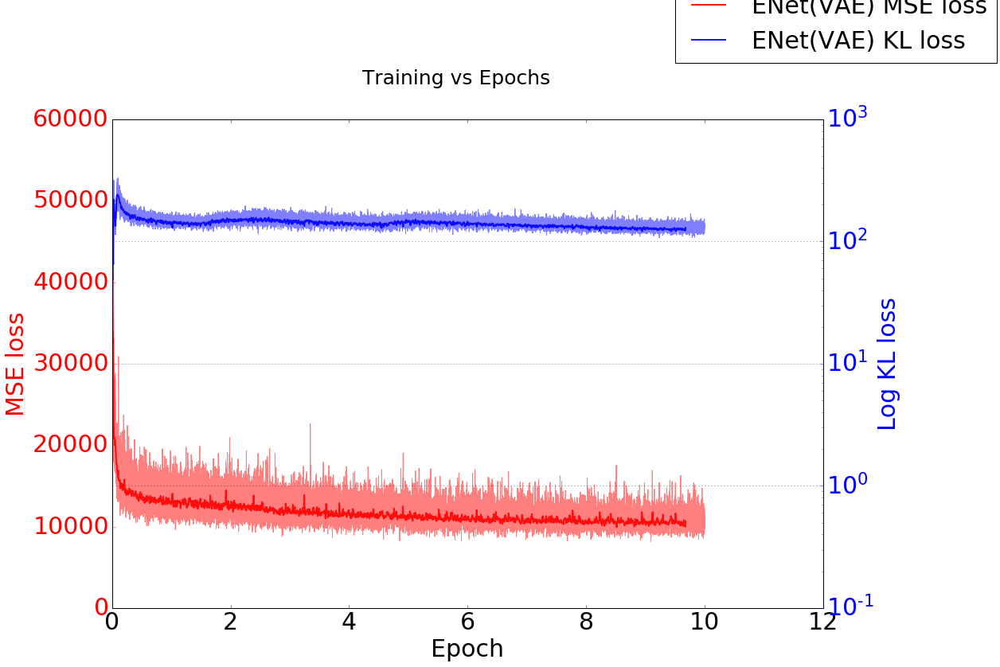

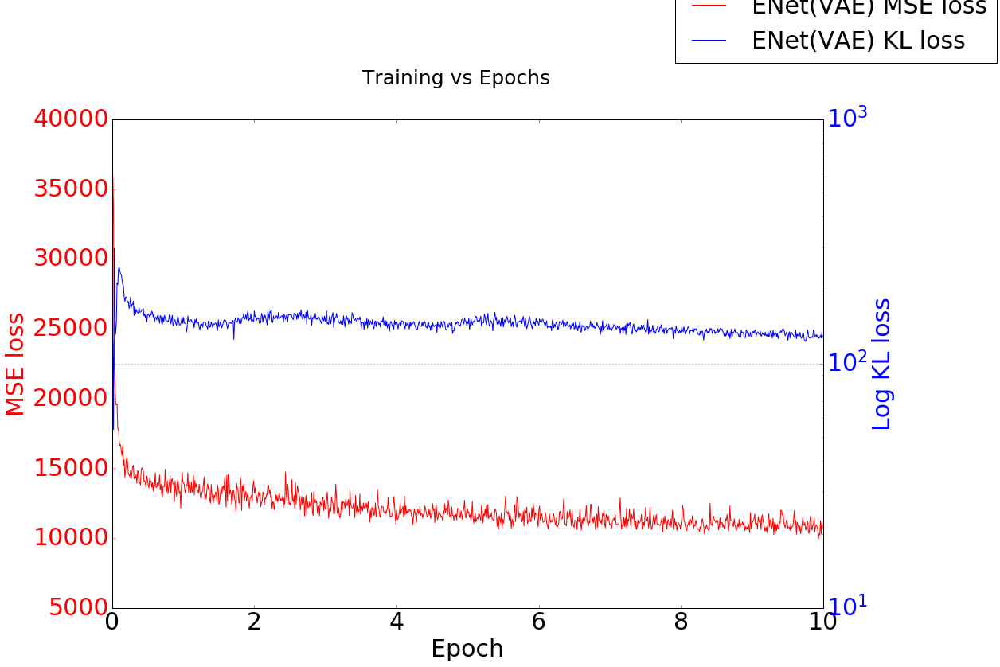

In [6]:
plot_log("20190726_200331", "ENet(VAE)", None, "VAE", "training")
plot_log("20190726_200331", "ENet(VAE)", None, "VAE", "training_validation")

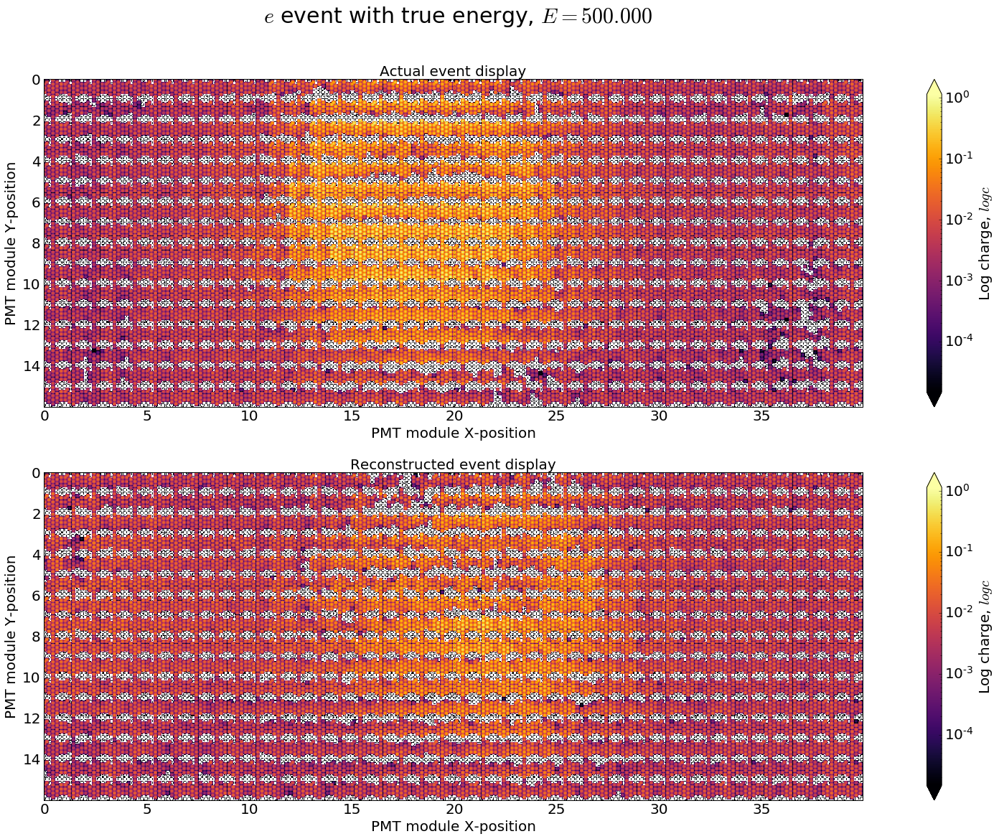

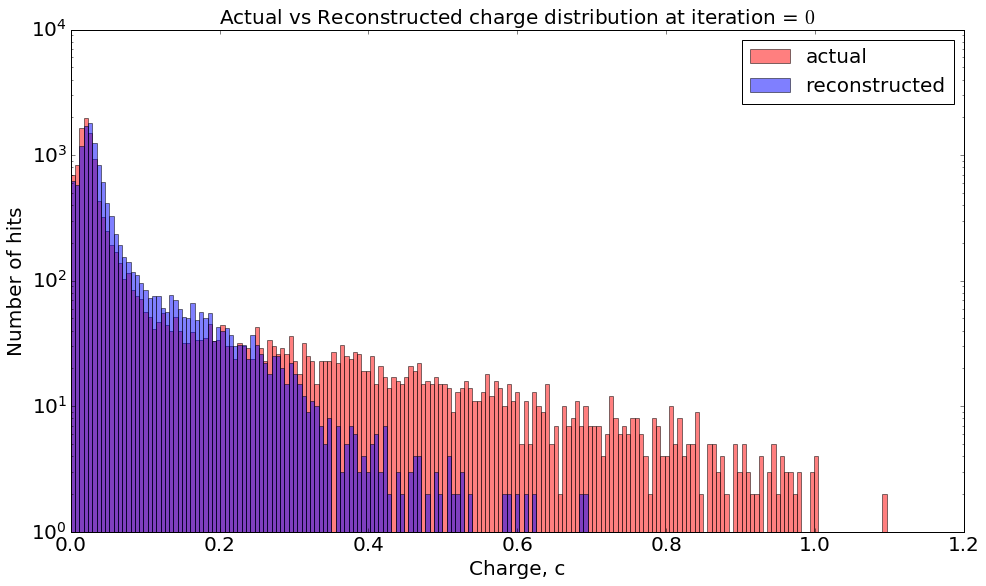

In [13]:
plot_samples("20190726_200331", 64, "ENet_56250")

## Latent vector analysis of the above results

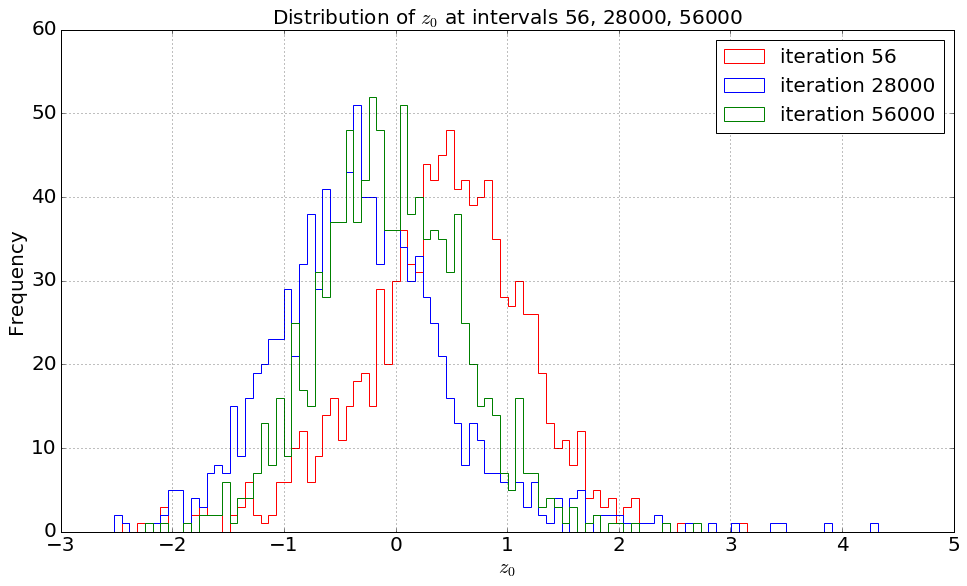

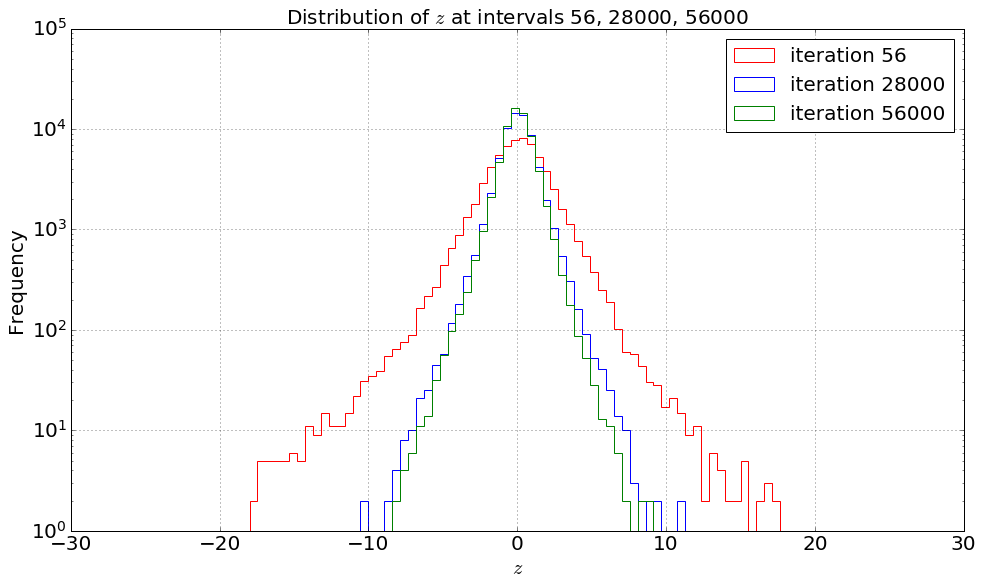

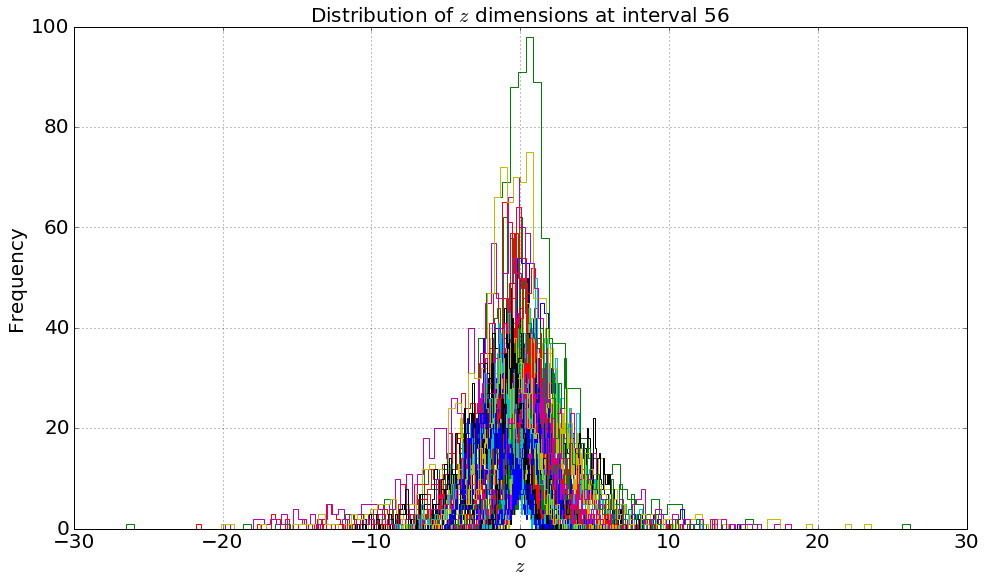

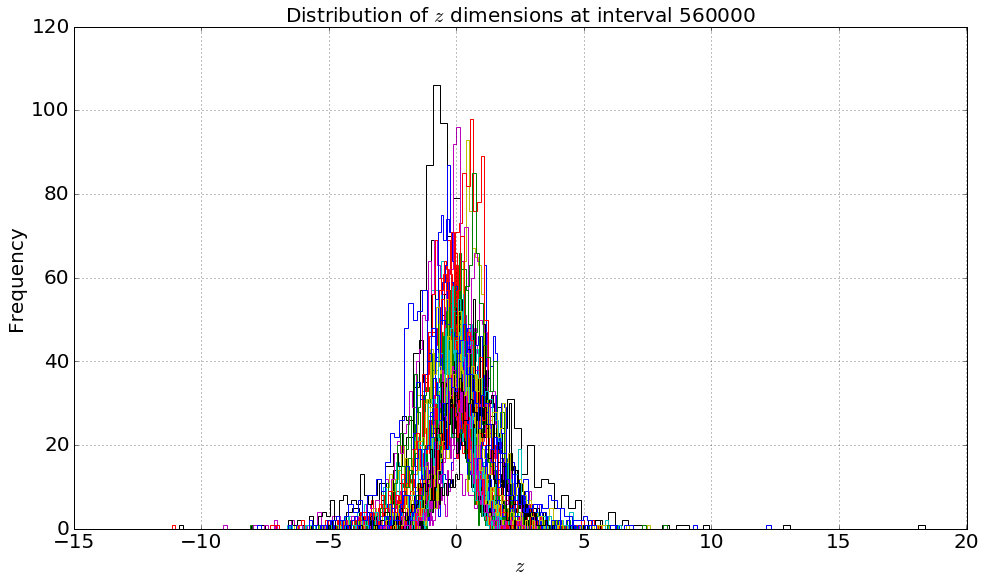

In [36]:
plot_latent_diagnostics("20190726_200331")

## Plot the distribution of all the latent dimensions at the start and end of the training

In [27]:
run_id = "20190726_200331"
dump_dir = "/home/akajal/WatChMaL/VAE/dumps/" + run_id + "/"
iterations = [56]
iteration_colors = ["blue"]

iteration_color_dict = {}
for i,iteration in enumerate(iterations):                    
    iteration_color_dict[iteration] = iteration_colors[i]

# Load the numpy array for the various iterations
np_arr_dict = {}
for iteration in iterations:
    np_arr_dict[iteration] = np.load(dump_dir + "iteration_" + str(iteration) + ".npz")["z"]

num_dims = np_arr_dict[list(np_arr_dict.keys())[0]].shape[1]
scatter_values = {}

for iteration in iterations:
    
    iter_scatter_values_mu = []
    iter_scatter_values_var = []
    
    for i in range(num_dims):
        iter_scatter_values_mu.append(np.mean(np_arr_dict[iteration][:,i]))
        iter_scatter_values_var.append(np.var(np_arr_dict[iteration][:,i]))
        
    scatter_values[iteration] = [iter_scatter_values_mu, iter_scatter_values_var]
    
# Initialize the figure
fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
ax.tick_params(axis="both", labelsize=20)

# Use the dimensions as the values for the x-axis
x = np.linspace(1, num_dims, num_dims)

# Plot the scatter for mu values for each of the iteration
for iteration in iterations:
    plt.scatter(x, scatter_values[iteration][0], color=iteration_color_dict[iteration],
                label="iteration {0}".format(iteration), s=100)
    
# Setup the axes
ax.set_xlabel(r"$z$ dimension", fontsize=20)
ax.set_ylabel(r"$\mu$", fontsize=20)

plt.legend(loc="upper right", prop={"size":20})
plt.grid(True)
plt.title(r"Mean of different $z$ dimensions at iterations {0}".format(iterations), fontsize=20)

# Initialize the figure
fig, ax = plt.subplots(figsize=(16,9),facecolor="w")
ax.tick_params(axis="both", labelsize=20)

# Use the dimensions as the values for the x-axis
x = np.linspace(1, num_dims, num_dims)

# Plot the scatter for mu values for each of the iteration
for iteration in iterations:
    plt.scatter(x, scatter_values[iteration][1], s=100, color=iteration_color_dict[iteration],
                label="iteration {0}".format(iteration))
    
# Setup the axes
ax.set_xlabel(r"$z$ dimension", fontsize=20)
ax.set_ylabel(r"$\sigma$", fontsize=20)

plt.legend(loc="upper right", prop={"size":20})
plt.grid(True)
plt.title(r"Variance of different $z$ dimensions at iterations {0}".format(iterations), fontsize=20)

plt.show()

## Test 2 : Increasing the optimizer learning rate to 0.0001 (Adam) from 0.00001 (Adam)

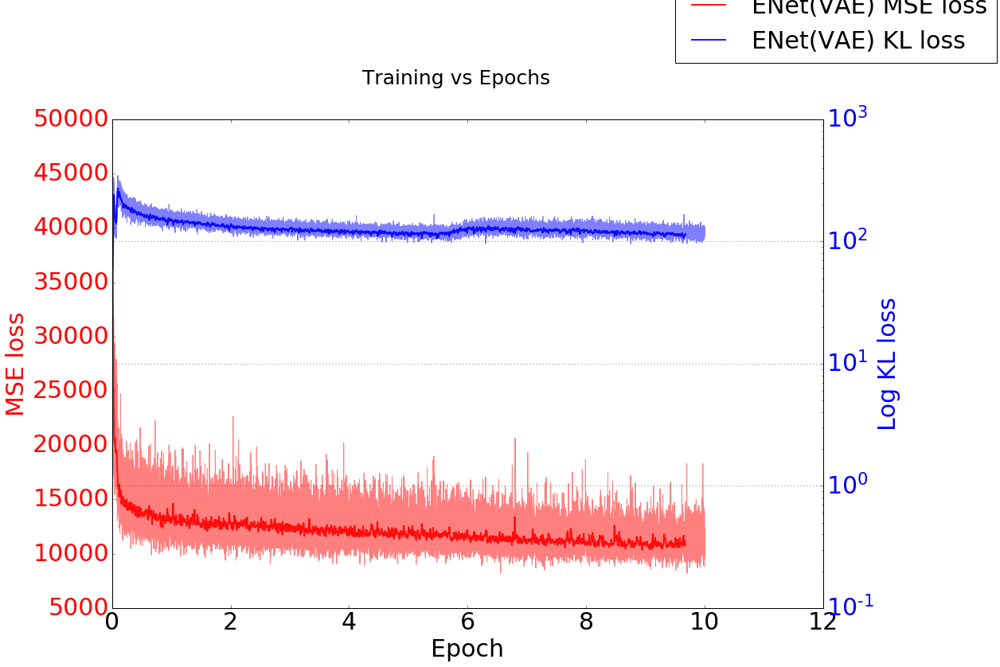

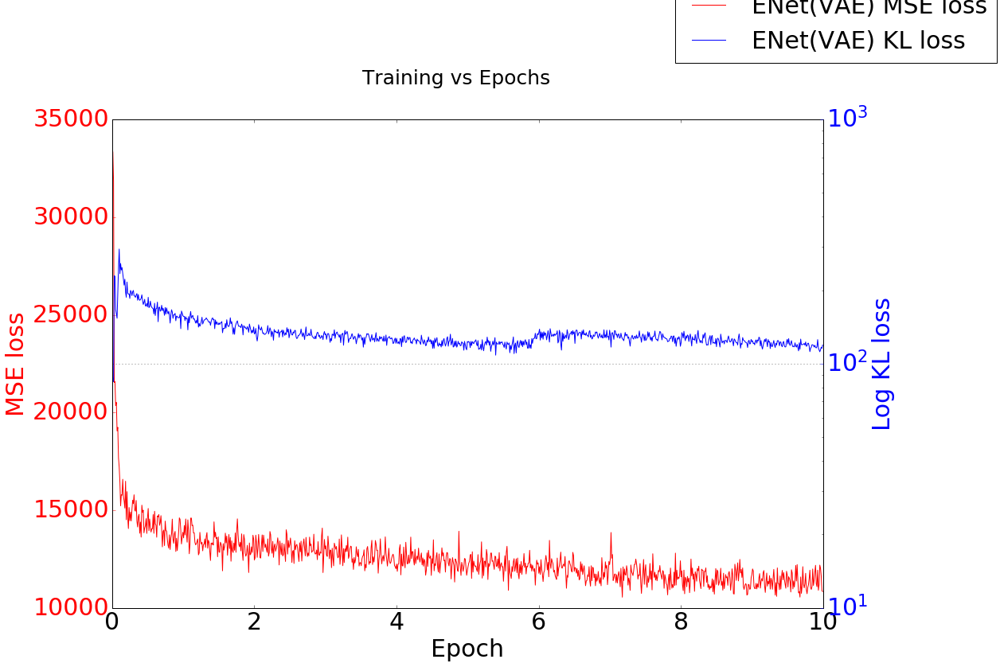

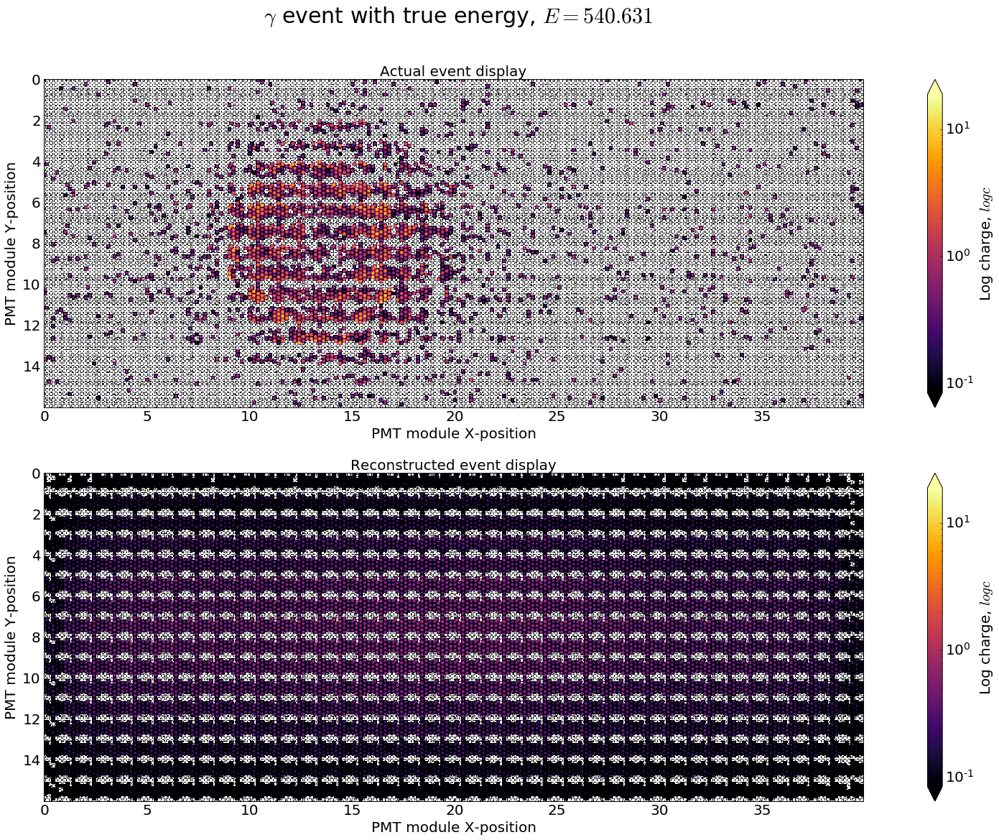

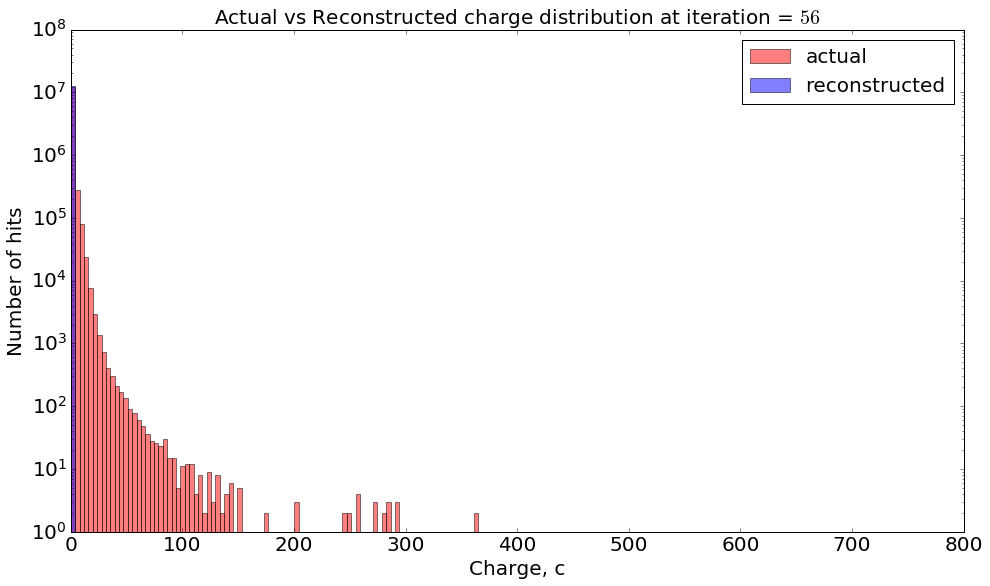

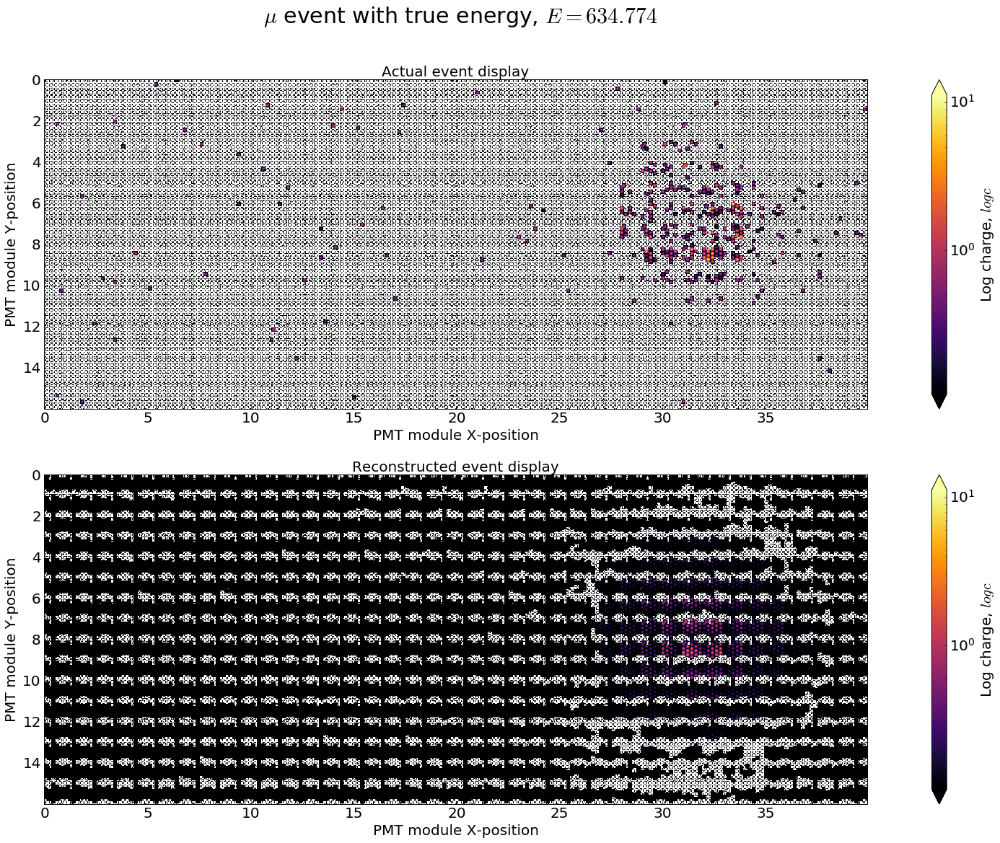

...

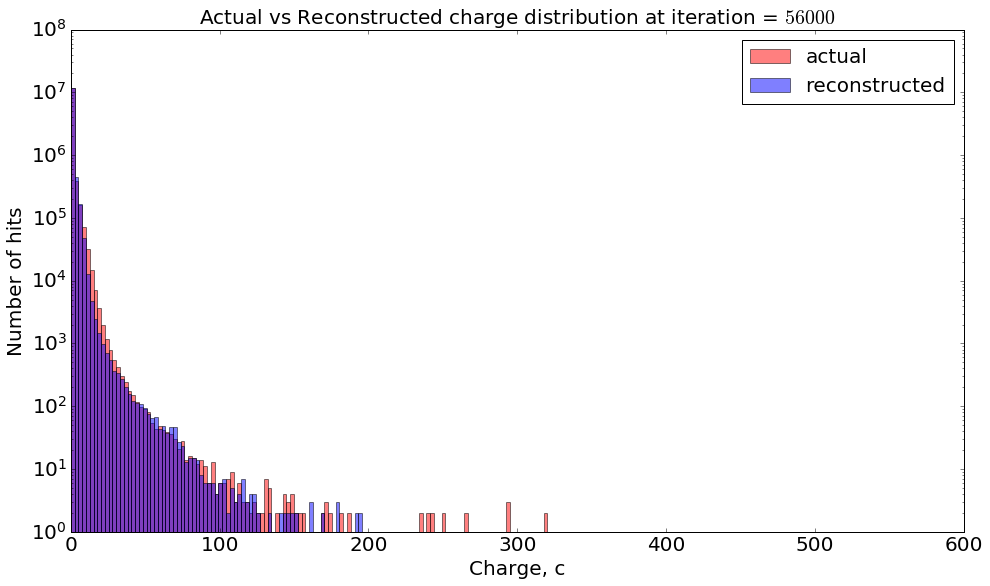

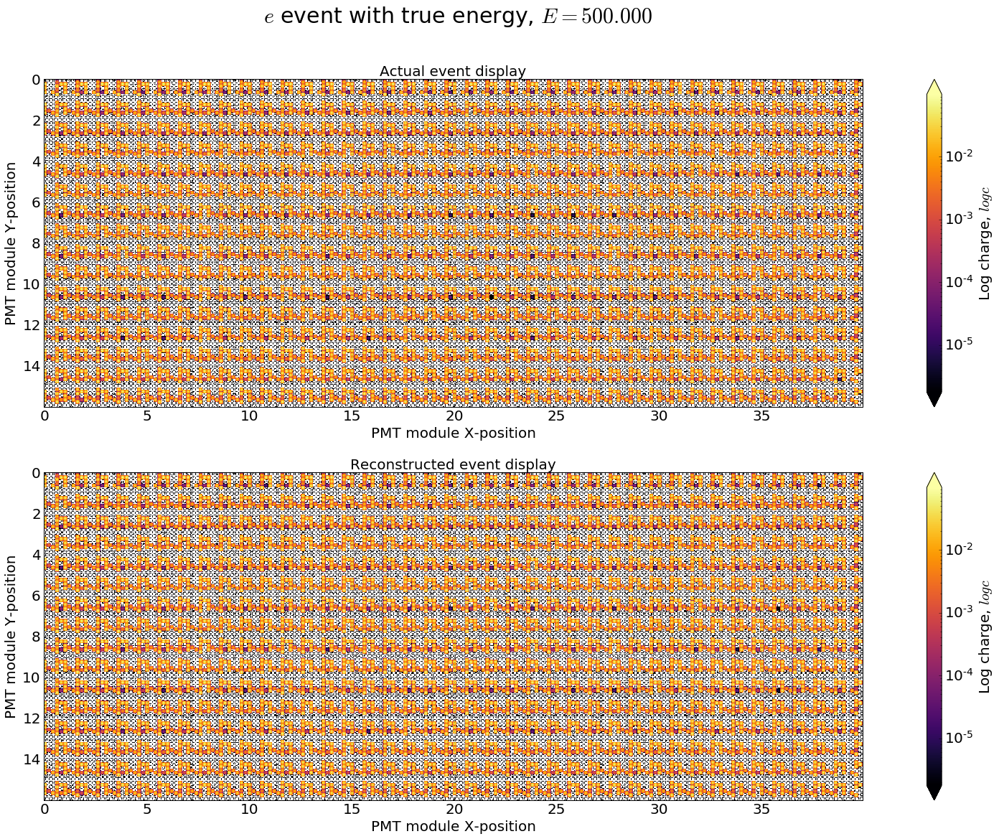

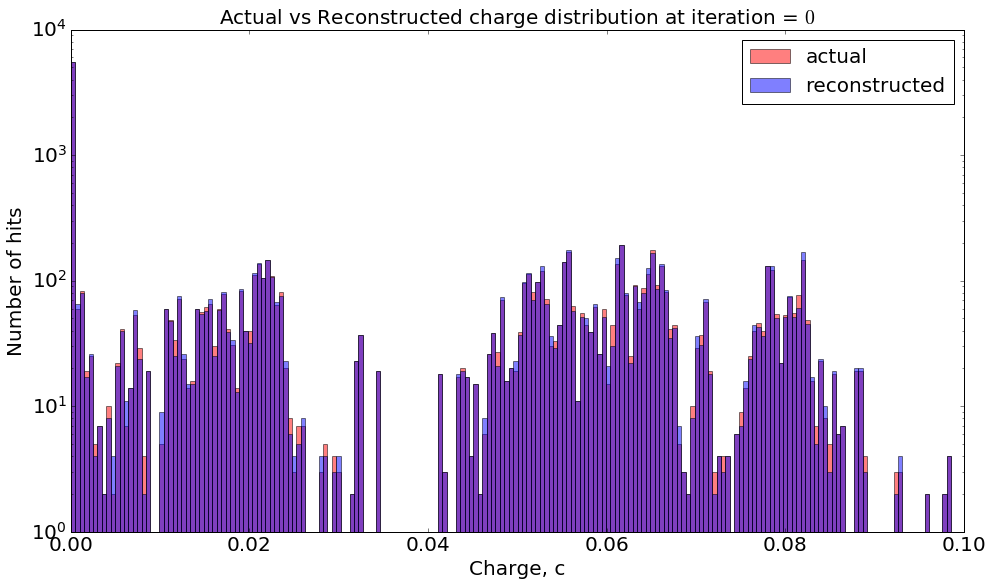

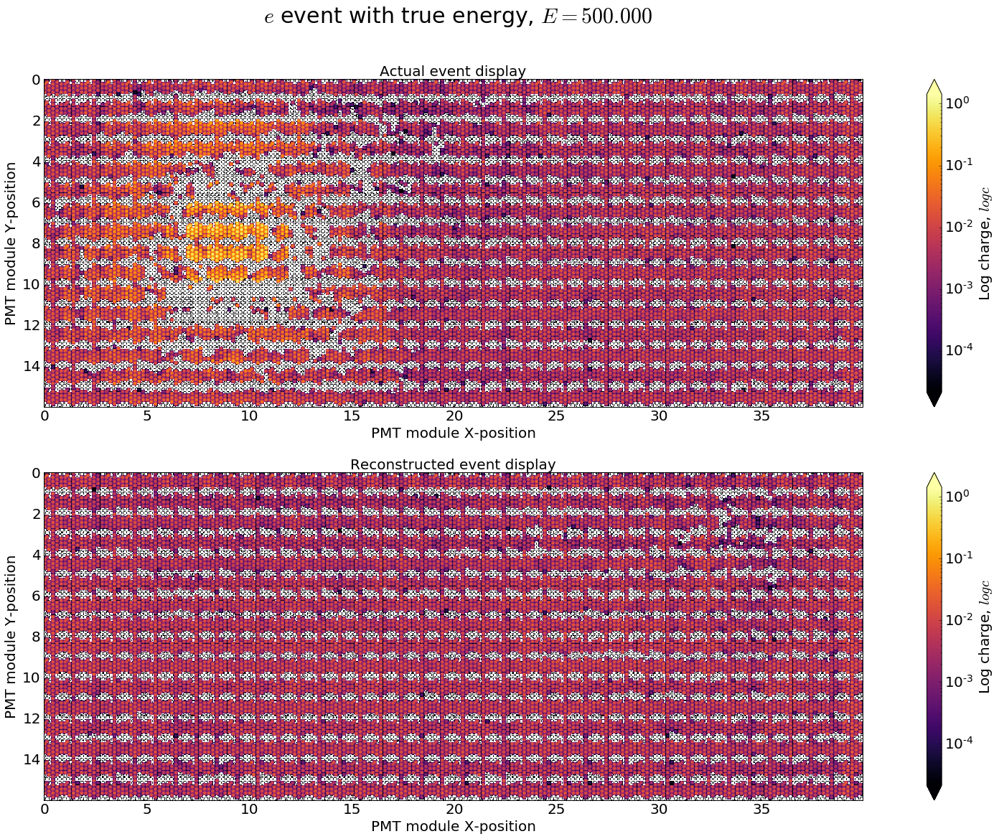

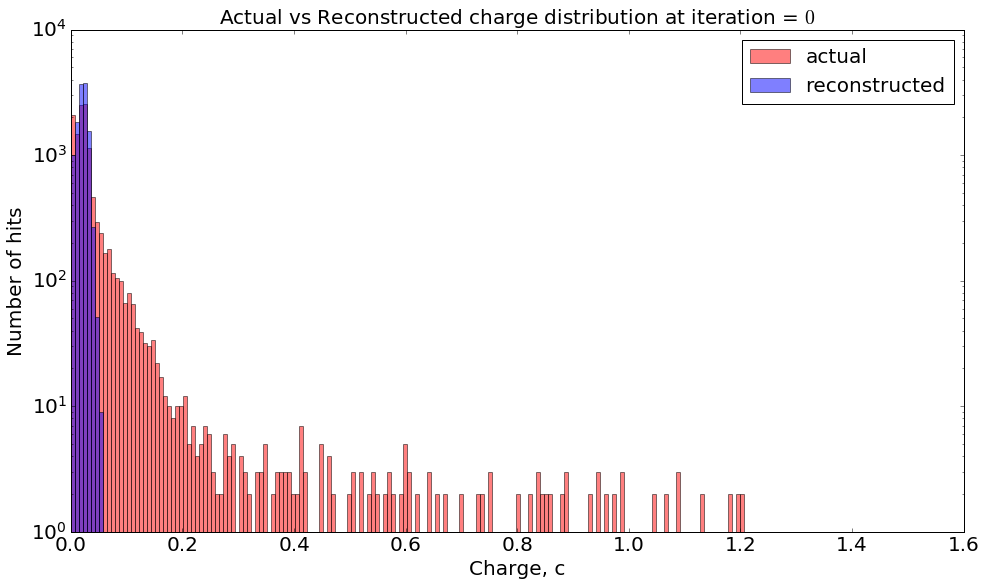

In [38]:
plot_training_diagnostics("20190727_005233")

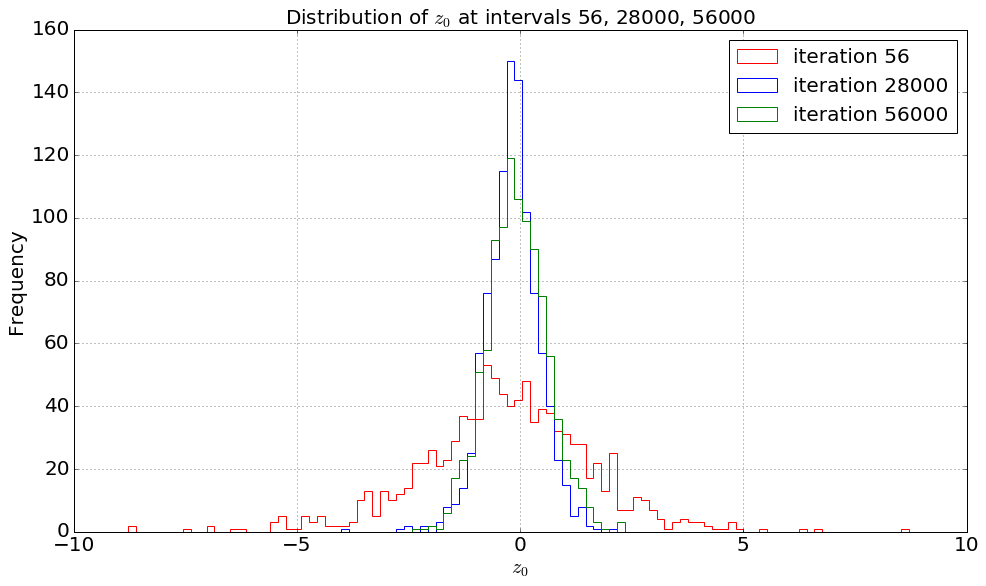

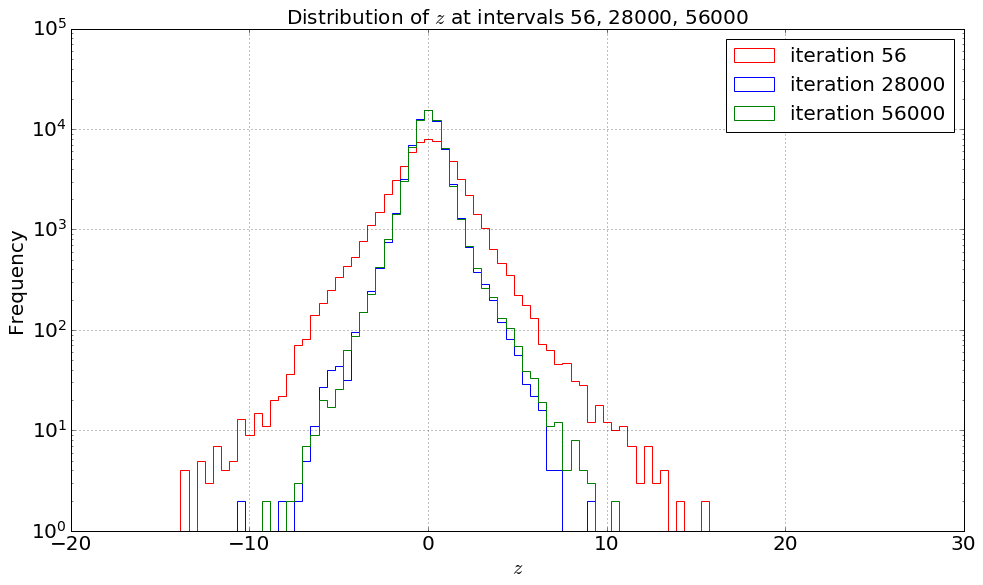

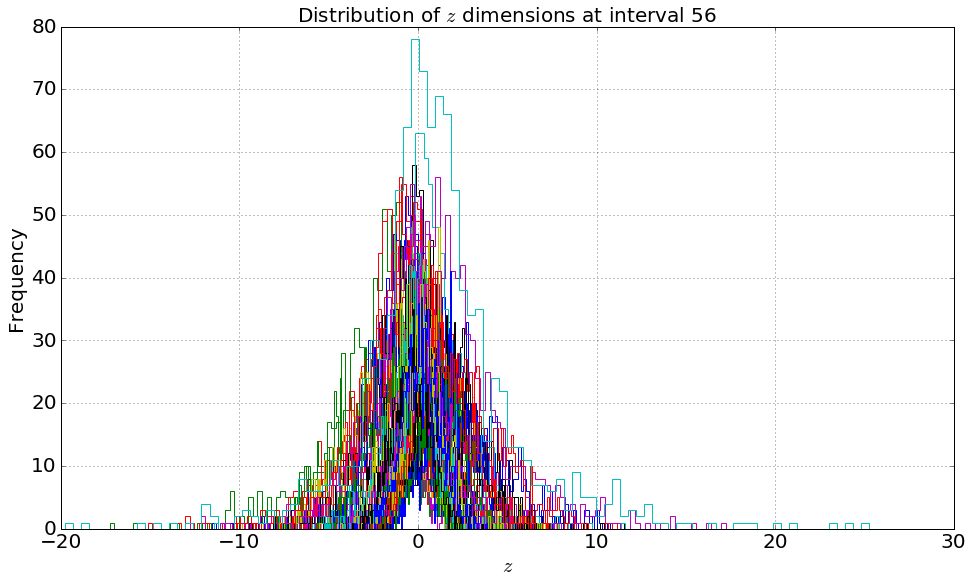

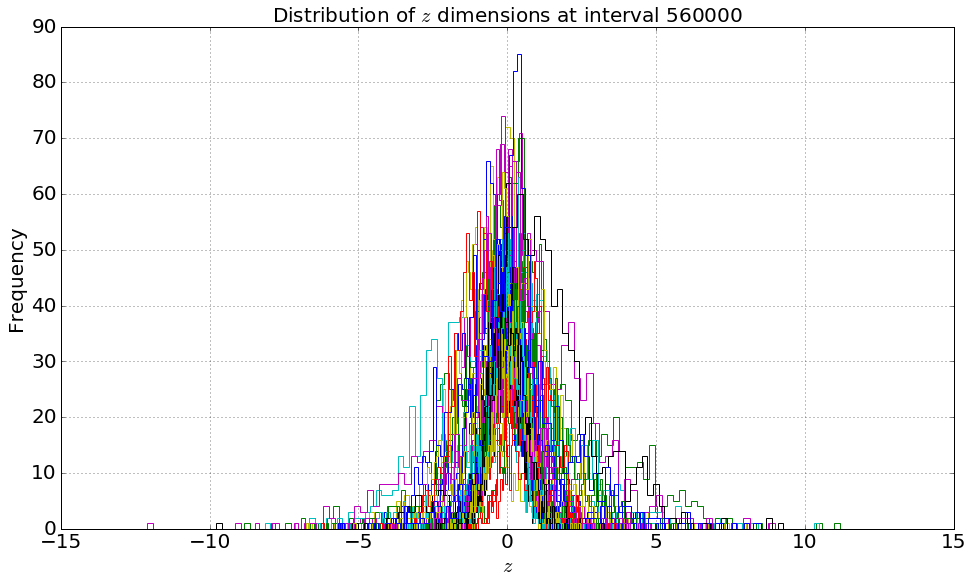

In [39]:
plot_latent_diagnostics("20190727_005233")